In [1]:
! pip install kaggle

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [2]:
! mkdir ~/.kaggle

In [3]:
! cp kaggle.json ~/.kaggle/

In [4]:
! chmod 600 ~/.kaggle/kaggle.json


In [5]:
!kaggle competitions download -c home-credit-default-risk

 96% 664M/688M [00:06<00:00, 106MB/s]
100% 688M/688M [00:06<00:00, 104MB/s]


In [6]:
!unzip /content/home-credit-default-risk.zip

Archive:  /content/home-credit-default-risk.zip
  inflating: HomeCredit_columns_description.csv  
  inflating: POS_CASH_balance.csv    
  inflating: application_test.csv    
  inflating: application_train.csv   
  inflating: bureau.csv              
  inflating: bureau_balance.csv      
  inflating: credit_card_balance.csv  
  inflating: installments_payments.csv  
  inflating: previous_application.csv  
  inflating: sample_submission.csv   


In [7]:
#Load data
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from sklearn.model_selection import train_test_split

In [8]:
app_train_data=pd.read_csv('/content/application_train.csv')
app_train_data

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307506,456251,0,Cash loans,M,N,N,0,157500.0,254700.0,27558.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
307507,456252,0,Cash loans,F,N,Y,0,72000.0,269550.0,12001.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
307508,456253,0,Cash loans,F,N,Y,0,153000.0,677664.0,29979.0,...,0,0,0,0,1.0,0.0,0.0,1.0,0.0,1.0
307509,456254,1,Cash loans,F,N,Y,0,171000.0,370107.0,20205.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [9]:
count=app_train_data.isnull().sum().sort_values(ascending=False)
percentage=(app_train_data.isnull().sum()/len(app_train_data)*100).sort_values(ascending=False)
missing_data=pd.concat([count,percentage],axis=1,keys=['Count','Percentage'])
print('Count and percentage of missing values for top 20 columns:')
missing_data.head(20)

Count and percentage of missing values for top 20 columns:


,Count,Percentage
COMMONAREA_MEDI,214865,69.872297
COMMONAREA_AVG,214865,69.872297
COMMONAREA_MODE,214865,69.872297
NONLIVINGAPARTMENTS_MODE,213514,69.432963
NONLIVINGAPARTMENTS_AVG,213514,69.432963
NONLIVINGAPARTMENTS_MEDI,213514,69.432963
FONDKAPREMONT_MODE,210295,68.386172
LIVINGAPARTMENTS_MODE,210199,68.354953
LIVINGAPARTMENTS_AVG,210199,68.354953
LIVINGAPARTMENTS_MEDI,210199,68.354953


In [10]:
columns_without_id=[col for col in app_train_data.columns if col!='SK_ID_CURR']

#checking duplicated data
app_train_data[app_train_data.duplicated(subset=columns_without_id,keep=False)]
print('The no of duplicates in the data:',app_train_data[app_train_data.duplicated(subset = columns_without_id, keep=False)].shape[0])


The no of duplicates in the data: 0


In [11]:
Loan_type_count=app_train_data['TARGET'].value_counts()
Loan_type_df=pd.DataFrame({'labels':Loan_type_count.index,'values':Loan_type_count.values})
Loan_type_df

,labels,values
0,0,282686
1,1,24825


In [12]:
fig = px.pie(Loan_type_df, values='values', names='labels', title='Types of Loan')
fig.show()

In [13]:
px.histogram(app_train_data[app_train_data['AMT_INCOME_TOTAL']<2000000]['AMT_INCOME_TOTAL'],nbins=100)

In [14]:
(app_train_data[app_train_data['AMT_INCOME_TOTAL'] > 1000000]['TARGET'].value_counts())/len(app_train_data[app_train_data['AMT_INCOME_TOTAL'] > 1000000])*100

0    94.8
1     5.2
Name: TARGET, dtype: float64

In [15]:
suite_val=app_train_data['NAME_TYPE_SUITE'].value_counts()/len(app_train_data)*100
suite_val

Unaccompanied      80.818572
Family             13.056118
Spouse, partner     3.697429
Children            1.062401
Other_B             0.575589
Other_A             0.281616
Group of people     0.088127
Name: NAME_TYPE_SUITE, dtype: float64

In [16]:
px.bar(suite_val)

In [17]:
suite_val = app_train_data['NAME_TYPE_SUITE'].value_counts()
suite_val_y1 = [app_train_data.loc[app_train_data['NAME_TYPE_SUITE'] == val, 'TARGET'].eq(1).sum() for val in suite_val.index]
suite_val_y0 = [app_train_data.loc[app_train_data['NAME_TYPE_SUITE'] == val, 'TARGET'].eq(0).sum() for val in suite_val.index]

data = px.bar(
    x=suite_val.index,
    y=[(suite_val_y1 / suite_val.sum()) * 100, (suite_val_y0 / suite_val.sum()) * 100],
    labels={'x': 'Name of Type of Suite', 'y': 'Count of Applicants (%)', 'color': 'Loan Repayment'},
    color_discrete_sequence=['blue', 'orange'],
    barmode='group',
    title='Who Accompanied Client when Applying for the Application in Terms of Loan Repayment (%)'
)

data.update_layout(
    xaxis_title='Name of Type of Suite',
    yaxis_title='Count of Applicants (%)',
    plot_bgcolor='rgba(0,0,0,0)',
    title_x=0.5
)
data.update_traces(texttemplate='%{y:.2f}%', textposition='outside')
data.show()


In [18]:
income_val = app_train_data['NAME_INCOME_TYPE'].value_counts()
income_val_y1 = [app_train_data.loc[app_train_data['NAME_INCOME_TYPE'] == val, 'TARGET'].eq(1).sum() for val in income_val.index]
income_val_y0 = [app_train_data.loc[app_train_data['NAME_INCOME_TYPE'] == val, 'TARGET'].eq(0).sum() for val in income_val.index]

data = px.bar(
    x=income_val.index,
    y=[(income_val_y1 / income_val.sum()) * 100, (income_val_y0 / income_val.sum()) * 100],
    labels={'x': 'Income Type', 'y': 'Count of Applicants (%)', 'color': 'Loan Repayment'},
    color_discrete_sequence=['blue', 'orange'],
    barmode='group',
    title='Who Accompanied Client when Applying for the Application in Terms of Loan Repayment (%)'
)

data.update_layout(
    xaxis_title='Income',
    yaxis_title='Count of Applicants (%)',
    plot_bgcolor='rgba(0,0,0,0)',
    title_x=0.5
)
data.update_traces(texttemplate='%{y:.2f}%', textposition='outside')
data.show()

In [19]:
fig = px.histogram(
    x=app_train_data['DAYS_BIRTH'] / (-365),
    nbins=50,
    labels={'x': 'Age', 'y': 'Count of type of applicants in %'},
    title='Distribution of Clients Age'
)

fig.show()

In [20]:
fig = px.histogram(
    x=app_train_data['DAYS_EMPLOYED'] ,
    nbins=50,
    labels={'x': 'Days', 'y': 'Count of type of applicants in %'},
    title='Days before the application the person started current employment'
)

fig.show()

Observations:
1. The data looks strange(we have -1000.66 years(-365243 days) of employment which is impossible) looks like there is data entry error.

In [21]:
error = app_train_data[app_train_data['DAYS_EMPLOYED'] == 365243]
print('The no of errors are :', len(error))
(error['TARGET'].value_counts()/len(error))*100

The no of errors are : 55374


0    94.600354
1     5.399646
Name: TARGET, dtype: float64

In [22]:
# Create an error flag column
app_train_data['DAYS_EMPLOYED_ERROR'] = app_train_data["DAYS_EMPLOYED"] == 365243
# Replace the error values with nan
app_train_data['DAYS_EMPLOYED'].replace({365243: np.nan}, inplace = True)

In [23]:
fig = px.histogram(
    x=app_train_data['DAYS_EMPLOYED']/(-365) ,
    nbins=50,
    labels={'x': 'Days', 'y': 'Count of type of applicants in %'},
    title='Days before the application the person started current employment'
)

fig.show()

In [24]:
app_train_data[app_train_data['DAYS_EMPLOYED']>(-365*2)]['TARGET'].value_counts()/sum(app_train_data['DAYS_EMPLOYED']>(-365*2))

0    0.887924
1    0.112076
Name: TARGET, dtype: float64

Observations:
1. The applicants with less than 2 years of employment are less likely to repay the loan.

In [25]:
app_train_data['Income_GT_CREDIT_FLAG']= app_train_data['AMT_INCOME_TOTAL']>app_train_data['AMT_CREDIT']
# Column to represent Credit Income Percent
app_train_data['CREDIT_INCOME_PERCENT'] = app_train_data['AMT_CREDIT'] / app_train_data['AMT_INCOME_TOTAL']
# Column to represent Annuity Income percent
app_train_data['ANNUITY_INCOME_PERCENT'] = app_train_data['AMT_ANNUITY'] / app_train_data['AMT_INCOME_TOTAL']
# Column to represent Credit Term
app_train_data['CREDIT_TERM'] = app_train_data['AMT_CREDIT'] / app_train_data['AMT_ANNUITY'] 
# Column to represent Days Employed percent in his life
app_train_data['DAYS_EMPLOYED_PERCENT'] = app_train_data['DAYS_EMPLOYED'] / app_train_data['DAYS_BIRTH']
# Shape of Application data
print("The shape of application data:",app_train_data.shape)

The shape of application data: (307511, 128)


In [26]:
print('Reading the data....', end='')
bureau = pd.read_csv('/content/bureau.csv')
print('done!!!')
print('The shape of data:',bureau.shape)
print('First 5 rows of data:')
bureau.head()

Reading the data....done!!!
The shape of data: (1716428, 17)
First 5 rows of data:


,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,215354,5714462,Closed,currency 1,-497,0,-153.0,-153.0,NaN,0,91323.0,0.0,NaN,0.0,Consumer credit,-131,NaN
1,215354,5714463,Active,currency 1,-208,0,1075.0,NaN,NaN,0,225000.0,171342.0,NaN,0.0,Credit card,-20,NaN
2,215354,5714464,Active,currency 1,-203,0,528.0,NaN,NaN,0,464323.5,NaN,NaN,0.0,Consumer credit,-16,NaN
3,215354,5714465,Active,currency 1,-203,0,NaN,NaN,NaN,0,90000.0,NaN,NaN,0.0,Credit card,-16,NaN
4,215354,5714466,Active,currency 1,-629,0,1197.0,NaN,77674.5,0,2700000.0,NaN,NaN,0.0,Consumer credit,-21,NaN


In [27]:
# Combining numerical features
grp = bureau.drop(['SK_ID_BUREAU'], axis = 1).groupby(by=['SK_ID_CURR']).mean().reset_index()
grp.columns = ['BUREAU_'+column if column !='SK_ID_CURR' else column for column in grp.columns]
application_bureau = app_train_data.merge(grp, on='SK_ID_CURR', how='left')
application_bureau.update(application_bureau[grp.columns].fillna(0))
# Combining categorical features
bureau_categorical = pd.get_dummies(bureau.select_dtypes('object'))
bureau_categorical['SK_ID_CURR'] = bureau['SK_ID_CURR']
grp = bureau_categorical.groupby(by = ['SK_ID_CURR']).mean().reset_index()
grp.columns = ['BUREAU_'+column if column !='SK_ID_CURR' else column for column in grp.columns]
application_bureau = application_bureau.merge(grp, on='SK_ID_CURR', how='left')
application_bureau.update(application_bureau[grp.columns].fillna(0))
# Shape of application and bureau data combined
print('The shape application and bureau data combined:',application_bureau.shape)

<ipython-input-27-65059a3b562a>:2: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



The shape application and bureau data combined: (307511, 163)


In [28]:
# Number of past loans per customer
grp = bureau.groupby(by = ['SK_ID_CURR'])['SK_ID_BUREAU'].count().reset_index().rename(columns = {'SK_ID_BUREAU': 'BUREAU_LOAN_COUNT'})
application_bureau = application_bureau.merge(grp, on='SK_ID_CURR', how='left')
application_bureau['BUREAU_LOAN_COUNT'] = application_bureau['BUREAU_LOAN_COUNT'].fillna(0)

In [29]:
# Number of types of past loans per customer 
grp = bureau[['SK_ID_CURR', 'CREDIT_TYPE']].groupby(by = ['SK_ID_CURR'])['CREDIT_TYPE'].nunique().reset_index().rename(columns={'CREDIT_TYPE': 'BUREAU_LOAN_TYPES'})
application_bureau = application_bureau.merge(grp, on='SK_ID_CURR', how='left')
application_bureau['BUREAU_LOAN_TYPES'] = application_bureau['BUREAU_LOAN_TYPES'].fillna(0)
# Debt over credit ratio 
bureau['AMT_CREDIT_SUM'] = bureau['AMT_CREDIT_SUM'].fillna(0)
bureau['AMT_CREDIT_SUM_DEBT'] = bureau['AMT_CREDIT_SUM_DEBT'].fillna(0)

In [30]:
grp1 = bureau[['SK_ID_CURR','AMT_CREDIT_SUM']].groupby(by=['SK_ID_CURR'])['AMT_CREDIT_SUM'].sum().reset_index().rename(columns={'AMT_CREDIT_SUM': 'TOTAL_CREDIT_SUM'})
grp2 = bureau[['SK_ID_CURR','AMT_CREDIT_SUM_DEBT']].groupby(by=['SK_ID_CURR'])['AMT_CREDIT_SUM_DEBT'].sum().reset_index().rename(columns={'AMT_CREDIT_SUM_DEBT':'TOTAL_CREDIT_SUM_DEBT'})
grp1['DEBT_CREDIT_RATIO'] = grp2['TOTAL_CREDIT_SUM_DEBT']/grp1['TOTAL_CREDIT_SUM']
del grp1['TOTAL_CREDIT_SUM']

In [31]:
grp1

,SK_ID_CURR,DEBT_CREDIT_RATIO
0,100001,0.410555
1,100002,0.284122
2,100003,0.000000
3,100004,0.000000
4,100005,0.864992
...,...,...
305806,456249,0.044147
305807,456250,0.723172
305808,456253,0.453493
305809,456254,0.000000


In [32]:
application_bureau.columns

Index(['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER',
       'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT', 'AMT_ANNUITY',
       ...
       'BUREAU_CREDIT_TYPE_Loan for purchase of shares (margin lending)',
       'BUREAU_CREDIT_TYPE_Loan for the purchase of equipment',
       'BUREAU_CREDIT_TYPE_Loan for working capital replenishment',
       'BUREAU_CREDIT_TYPE_Microloan',
       'BUREAU_CREDIT_TYPE_Mobile operator loan',
       'BUREAU_CREDIT_TYPE_Mortgage', 'BUREAU_CREDIT_TYPE_Real estate loan',
       'BUREAU_CREDIT_TYPE_Unknown type of loan', 'BUREAU_LOAN_COUNT',
       'BUREAU_LOAN_TYPES'],
      dtype='object', length=165)

In [33]:
application_bureau = application_bureau.merge(grp1, on='SK_ID_CURR', how='left')

In [34]:
application_bureau['DEBT_CREDIT_RATIO'] = application_bureau['DEBT_CREDIT_RATIO'].fillna(0)
application_bureau.replace([np.inf, -np.inf], 0,inplace=True)
application_bureau['DEBT_CREDIT_RATIO'] = pd.to_numeric(application_bureau['DEBT_CREDIT_RATIO'], downcast='float')

In [35]:
print('Reading the data....', end='')
previous_applicaton = pd.read_csv('previous_application.csv')
print('done!!!')
print('The shape of data:',previous_applicaton.shape)
print('First 5 rows of data:')
previous_applicaton.head()

Reading the data....done!!!
The shape of data: (1670214, 37)
First 5 rows of data:


,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,...,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,...,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,...,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,...,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,...,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


In [36]:
# Number of previous applications per customer
grp = previous_applicaton[['SK_ID_CURR','SK_ID_PREV']].groupby(by=['SK_ID_CURR'])['SK_ID_PREV'].count().reset_index().rename(columns={'SK_ID_PREV':'PREV_APP_COUNT'})
application_bureau_prev = application_bureau.merge(grp, on =['SK_ID_CURR'], how = 'left')
application_bureau_prev['PREV_APP_COUNT'] = application_bureau_prev['PREV_APP_COUNT'].fillna(0)
# Combining numerical features
grp = previous_applicaton.drop('SK_ID_PREV', axis =1).groupby(by=['SK_ID_CURR']).mean().reset_index()
prev_columns = ['PREV_'+column if column != 'SK_ID_CURR' else column for column in grp.columns ]
grp.columns = prev_columns
application_bureau_prev = application_bureau_prev.merge(grp, on =['SK_ID_CURR'], how = 'left')
application_bureau_prev.update(application_bureau_prev[grp.columns].fillna(0))
# Combining categorical features
prev_categorical = pd.get_dummies(previous_applicaton.select_dtypes('object'))
prev_categorical['SK_ID_CURR'] = previous_applicaton['SK_ID_CURR']
prev_categorical.head()
grp = prev_categorical.groupby('SK_ID_CURR').mean().reset_index()
grp.columns = ['PREV_'+column if column != 'SK_ID_CURR' else column for column in grp.columns]
application_bureau_prev = application_bureau_prev.merge(grp, on=['SK_ID_CURR'], how='left')
application_bureau_prev.update(application_bureau_prev[grp.columns].fillna(0))

<ipython-input-36-1c02b55df852>:6: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



In [37]:
print('Reading the data....', end='')
pos_cash = pd.read_csv('POS_CASH_balance.csv')
print('done!!!')
print('The shape of data:',pos_cash.shape)
print('First 5 rows of data:')
pos_cash.head()

Reading the data....done!!!
The shape of data: (10001358, 8)
First 5 rows of data:


,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,1803195,182943,-31,48.0,45.0,Active,0,0
1,1715348,367990,-33,36.0,35.0,Active,0,0
2,1784872,397406,-32,12.0,9.0,Active,0,0
3,1903291,269225,-35,48.0,42.0,Active,0,0
4,2341044,334279,-35,36.0,35.0,Active,0,0


In [38]:
# Combining numerical features
grp = pos_cash.drop('SK_ID_PREV', axis =1).groupby(by=['SK_ID_CURR']).mean().reset_index()
prev_columns = ['POS_'+column if column != 'SK_ID_CURR' else column for column in grp.columns ]
grp.columns = prev_columns
application_bureau_prev = application_bureau_prev.merge(grp, on =['SK_ID_CURR'], how = 'left')
application_bureau_prev.update(application_bureau_prev[grp.columns].fillna(0))
# Combining categorical features
pos_cash_categorical = pd.get_dummies(pos_cash.select_dtypes('object'))
pos_cash_categorical['SK_ID_CURR'] = pos_cash['SK_ID_CURR']
grp = pos_cash_categorical.groupby('SK_ID_CURR').mean().reset_index()
grp.columns = ['POS_'+column if column != 'SK_ID_CURR' else column for column in grp.columns]
application_bureau_prev = application_bureau_prev.merge(grp, on=['SK_ID_CURR'], how='left')
application_bureau_prev.update(application_bureau_prev[grp.columns].fillna(0))

<ipython-input-38-4c53cb9fb137>:2: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



In [39]:
print('Reading the data....', end='')
insta_payments = pd.read_csv('installments_payments.csv')
print('done!!!')
print('The shape of data:',insta_payments.shape)
print('First 5 rows of data:')
insta_payments.head()

Reading the data....done!!!
The shape of data: (13605401, 8)
First 5 rows of data:


,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,1054186,161674,1.0,6,-1180.0,-1187.0,6948.360,6948.360
1,1330831,151639,0.0,34,-2156.0,-2156.0,1716.525,1716.525
2,2085231,193053,2.0,1,-63.0,-63.0,25425.000,25425.000
3,2452527,199697,1.0,3,-2418.0,-2426.0,24350.130,24350.130
4,2714724,167756,1.0,2,-1383.0,-1366.0,2165.040,2160.585


In [40]:
# Combining numerical features and there are no categorical features in this dataset
grp = insta_payments.drop('SK_ID_PREV', axis =1).groupby(by=['SK_ID_CURR']).mean().reset_index()
prev_columns = ['INSTA_'+column if column != 'SK_ID_CURR' else column for column in grp.columns ]
grp.columns = prev_columns
application_bureau_prev = application_bureau_prev.merge(grp, on =['SK_ID_CURR'], how = 'left')
application_bureau_prev.update(application_bureau_prev[grp.columns].fillna(0))

In [41]:
print('Reading the data....', end='')
credit_card = pd.read_csv('credit_card_balance.csv')
print('done!!!')
print('The shape of data:',credit_card.shape)
print('First 5 rows of data:')
credit_card.head()

Reading the data....done!!!
The shape of data: (3840312, 23)
First 5 rows of data:


,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,...,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,2562384,378907,-6,56.970,135000,0.0,877.5,0.0,877.5,1700.325,...,0.000,0.000,0.0,1,0.0,1.0,35.0,Active,0,0
1,2582071,363914,-1,63975.555,45000,2250.0,2250.0,0.0,0.0,2250.000,...,64875.555,64875.555,1.0,1,0.0,0.0,69.0,Active,0,0
2,1740877,371185,-7,31815.225,450000,0.0,0.0,0.0,0.0,2250.000,...,31460.085,31460.085,0.0,0,0.0,0.0,30.0,Active,0,0
3,1389973,337855,-4,236572.110,225000,2250.0,2250.0,0.0,0.0,11795.760,...,233048.970,233048.970,1.0,1,0.0,0.0,10.0,Active,0,0
4,1891521,126868,-1,453919.455,450000,0.0,11547.0,0.0,11547.0,22924.890,...,453919.455,453919.455,0.0,1,0.0,1.0,101.0,Active,0,0


In [42]:
# Combining numerical features
grp = credit_card.drop('SK_ID_PREV', axis =1).groupby(by=['SK_ID_CURR']).mean().reset_index()
prev_columns = ['CREDIT_'+column if column != 'SK_ID_CURR' else column for column in grp.columns ]
grp.columns = prev_columns
application_bureau_prev = application_bureau_prev.merge(grp, on =['SK_ID_CURR'], how = 'left')
application_bureau_prev.update(application_bureau_prev[grp.columns].fillna(0))
# Combining categorical features
credit_categorical = pd.get_dummies(credit_card.select_dtypes('object'))
credit_categorical['SK_ID_CURR'] = credit_card['SK_ID_CURR']
grp = credit_categorical.groupby('SK_ID_CURR').mean().reset_index()
grp.columns = ['CREDIT_'+column if column != 'SK_ID_CURR' else column for column in grp.columns]
application_bureau_prev = application_bureau_prev.merge(grp, on=['SK_ID_CURR'], how='left')
application_bureau_prev.update(application_bureau_prev[grp.columns].fillna(0))

<ipython-input-42-1b3f6d1ba0ac>:2: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



In [43]:
print("Shape of final prepared data: ",application_bureau_prev.shape)

Shape of final prepared data:  (307511, 376)


In [44]:
application_bureau_prev

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,CREDIT_CNT_INSTALMENT_MATURE_CUM,CREDIT_SK_DPD,CREDIT_SK_DPD_DEF,CREDIT_NAME_CONTRACT_STATUS_Active,CREDIT_NAME_CONTRACT_STATUS_Approved,CREDIT_NAME_CONTRACT_STATUS_Completed,CREDIT_NAME_CONTRACT_STATUS_Demand,CREDIT_NAME_CONTRACT_STATUS_Refused,CREDIT_NAME_CONTRACT_STATUS_Sent proposal,CREDIT_NAME_CONTRACT_STATUS_Signed
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307506,456251,0,Cash loans,M,N,N,0,157500.0,254700.0,27558.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
307507,456252,0,Cash loans,F,N,Y,0,72000.0,269550.0,12001.5,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
307508,456253,0,Cash loans,F,N,Y,0,153000.0,677664.0,29979.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
307509,456254,1,Cash loans,F,N,Y,0,171000.0,370107.0,20205.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


Hypothesis Testing

H0: There is no difference in mean income between male and female applicants.

Ha: There is a difference in mean income between male and female applicants.

In [45]:
from scipy import stats
# separate the data by gender
male_income = application_bureau[application_bureau['CODE_GENDER'] == 'M']['AMT_INCOME_TOTAL']
female_income = application_bureau[application_bureau['CODE_GENDER'] == 'F']['AMT_INCOME_TOTAL']

# calculate the means and standard deviations
male_mean = male_income.mean()
female_mean = female_income.mean()
male_std = male_income.std()
female_std = female_income.std()

# calculate the t-statistic and p-value
t_stat, p_value = stats.ttest_ind(male_income, female_income, equal_var=False)

# print the results
print('Male mean income:', male_mean)
print('Female mean income:', female_mean)
print('t-statistic:', t_stat)
print('p-value:', p_value)


Male mean income: 193396.48215317106
Female mean income: 156032.30924684365
t-statistic: 50.5883277577419
p-value: 0.0


Since the pvalue is less than the significance level of 0.05 we reject H0 hence we conclude that there is a significant difference in mean income between male and female applicants.

Analysis Of Variance:

The main objctive of analysis of variance is to find if there exists an signifanct difference between sample means.

To perform the same , I have grouped the data on the basis of contract type and then considered 3 features AMT_INCOME_TOTAL, AMT_CREDIT, AMT_ANNUITY and calculated the means and performed the following hypothesis testing:

H0: The means of all the groups is the same

H1: There is an signifance difference in the means of the samples.

In [46]:
from scipy.stats import f_oneway
# Group the data by the NAME_CONTRACT_TYPE column
groups = application_bureau.groupby('NAME_CONTRACT_TYPE')

# Calculate the means of AMT_INCOME_TOTAL, AMT_CREDIT, and AMT_ANNUITY for each group
means = groups['AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY'].mean()

# Perform the ANOVA test
fvalue, pvalue = f_oneway(means['AMT_INCOME_TOTAL'], means['AMT_CREDIT'], means['AMT_ANNUITY'])

# Print the results
print('F-value:', fvalue)
print('p-value:', pvalue)


F-value: 6.960920733800826
p-value: 0.07464667179954251


<ipython-input-46-7020833491cf>:6: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



## Observations:

- As we can see that our p value is greater the significance value of alpha=0.05 ( which is the default value). Hence we accept H0 which means there is no signifance difference between the sample means.


## Chi-Sqaure test

In [47]:
application_bureau.select_dtypes(include='object')

,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,OCCUPATION_TYPE,WEEKDAY_APPR_PROCESS_START,ORGANIZATION_TYPE,FONDKAPREMONT_MODE,HOUSETYPE_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE
0,Cash loans,M,N,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,Laborers,WEDNESDAY,Business Entity Type 3,reg oper account,block of flats,"Stone, brick",No
1,Cash loans,F,N,N,Family,State servant,Higher education,Married,House / apartment,Core staff,MONDAY,School,reg oper account,block of flats,Block,No
2,Revolving loans,M,Y,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,Laborers,MONDAY,Government,NaN,NaN,NaN,NaN
3,Cash loans,F,N,Y,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,Laborers,WEDNESDAY,Business Entity Type 3,NaN,NaN,NaN,NaN
4,Cash loans,M,N,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,Core staff,THURSDAY,Religion,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307506,Cash loans,M,N,N,Unaccompanied,Working,Secondary / secondary special,Separated,With parents,Sales staff,THURSDAY,Services,reg oper account,block of flats,"Stone, brick",No
307507,Cash loans,F,N,Y,Unaccompanied,Pensioner,Secondary / secondary special,Widow,House / apartment,NaN,MONDAY,XNA,reg oper account,block of flats,"Stone, brick",No
307508,Cash loans,F,N,Y,Unaccompanied,Working,Higher education,Separated,House / apartment,Managers,THURSDAY,School,reg oper account,block of flats,Panel,No
307509,Cash loans,F,N,Y,Unaccompanied,Commercial associate,Secondary / secondary special,Married,House / apartment,Laborers,WEDNESDAY,Business Entity Type 1,NaN,block of flats,"Stone, brick",No


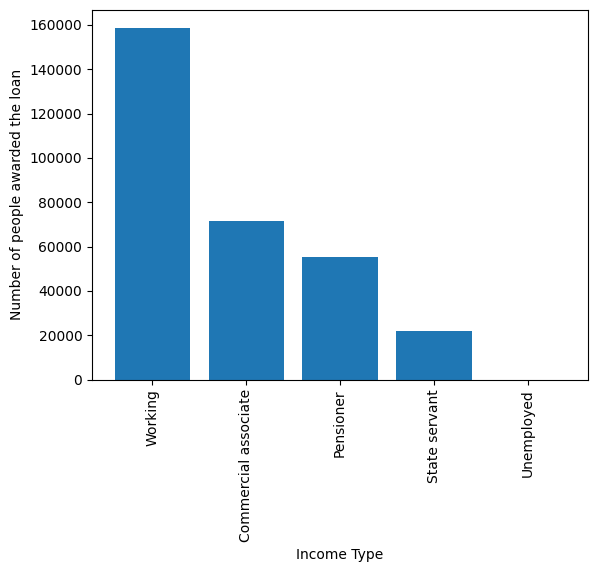

In [54]:
freq_table = application_bureau.NAME_INCOME_TYPE.value_counts().head(5)
plt.bar(freq_table.index, freq_table.values)
plt.xticks(rotation=90)
plt.xlabel('Income Type')
plt.ylabel('Number of people awarded the loan')
plt.show()

When an bank or loan agency decides to grant a paticular loan to anyone they look at many factors like the income of the borrower , the deisgnation of the borrower if he/she is employed as sometimes the income of the borrower is based on the designation/role they are employed in which gives an surety of loan being repayed.

In [60]:
from scipy.stats import chi2_contingency

In [57]:
contingency_table = pd.crosstab(index=application_bureau['NAME_INCOME_TYPE'], 
                                columns=[application_bureau['OCCUPATION_TYPE'], application_bureau['TARGET']])


In [58]:
contingency_table

OCCUPATION_TYPE      Accountants      Cleaning staff      Cooking staff       \
TARGET                         0    1              0    1             0    1   
NAME_INCOME_TYPE                                                               
Businessman                    0    0              0    0             0    0   
Commercial associate        3787  183            815   77          1191  114   
Maternity leave                1    0              0    0             0    0   
Pensioner                      0    0              2    0             0    0   
State servant                697   32            244   17           410   43   
Student                        1    0              0    0             0    0   
Working                     4853  259           3145  353          3724  464   

OCCUPATION_TYPE      Core staff      Drivers        ... Realty agents      \
TARGET                        0    1       0     1  ...             0   1   
NAME_INCOME_TYPE                                    ...                     
Businessman                   1    0       0     0  ...             0   0   
Commercial associate       6113  415    4419   497  ...           306  18   
Maternity leave               1    1       0     0  ...             0   0   
Pensioner                     0    0       0     0  ...             0   0   
State servant              6608  348     747    68  ...             9   0   
Student                       3    0       1     0  ...             0   0   
Working                   13106  974   11329  1542  ...           377  41   

OCCUPATION_TYPE      Sales staff       Secretaries     Security staff       \
TARGET                         0     1           0   1              0    1   
NAME_INCOME_TYPE                                                             
Businessman                    0     0           0   0              0    0   
Commercial associate       10152   952         320  23           1426  133   
Maternity leave                0     0           0   0              0    0   
Pensioner                      1     0           0   0              0    0   
State servant                162    24         248  16            351   29   
Student                        0     0           0   0              0    0   
Working                    18695  2116         645  53           4222  560   

OCCUPATION_TYPE      Waiters/barmen staff       
TARGET                                  0    1  
NAME_INCOME_TYPE                                
Businessman                             0    0  
Commercial associate                  340   46  
Maternity leave                         0    0  
Pensioner                               0    0  
State servant                          50    3  
Student                                 1    0  
Working                               805  103  

[7 rows x 36 columns]

In [61]:
chi2, p_value, dof, expected = chi2_contingency(contingency_table)

In [64]:
# Print the results
print("Chi-square statistic:", chi2)
print("P-value:", p_value)
print("Degrees of freedom:", dof)
print("Expected frequencies:\n", expected)

# Make a hypothesis decision based on the p-value
if p_value < 0.05:
    print("Reject the null hypothesis: There is a significant association between the two variables.")
else:
    print("Fail to reject the null hypothesis: There is no significant association between the two variables.")

Chi-square statistic: 27082.564216702038
P-value: 0.0
Degrees of freedom: 210
Expected frequencies:
 [[3.53884047e-01 1.79613490e-02 1.59378552e-01 1.69382342e-02
  2.01780978e-01 2.35316408e-02 9.78855627e-01 6.58582797e-02
  6.25085260e-01 7.98408488e-02 1.99696855e-02 1.36415309e-03
  4.04660856e-01 2.65630921e-02 1.86434255e-02 1.28836681e-03
  1.86995074e+00 2.21220159e-01 6.57067071e-02 1.36036377e-02
  7.59492232e-01 5.03220917e-02 3.01818871e-01 2.16748768e-02
  9.38613111e-02 6.63129973e-03 2.62220538e-02 2.23569534e-03
  1.09928003e+00 1.17165593e-01 4.59643804e-02 3.48616900e-03
  2.27320955e-01 2.73588480e-02 4.53201970e-02 5.75975748e-03]
 [2.62405021e+03 1.33183403e+02 1.18179197e+03 1.25597006e+02
  1.49620595e+03 1.74487116e+02 7.25821448e+03 4.88339144e+02
  4.63500720e+03 5.92019894e+02 1.48075218e+02 1.01151951e+01
  3.00056025e+03 1.96965328e+02 1.38241000e+02 9.55323986e+00
  1.38656847e+04 1.64034748e+03 4.87215233e+02 1.00870974e+02
  5.63163490e+03 3.73138310e+0